# WEBSCRAPING PROJECT 
## DATA SCRAPPING TOP 500 GREATEST MOVIES FROM THE IMDB WEBSITE

In [1]:
# IMPORTING LIBRARIES


import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt
import seaborn as sns
from bs4 import BeautifulSoup
import requests as rq


In [2]:
# FROM THE DESIRED WEBPAGE COPY THE URL WITH A NAME
url='https://www.imdb.com/list/ls050782187'
url

'https://www.imdb.com/list/ls050782187'

In [3]:
# REQUESTING WEBSITE TO SCRAP THE DATA FROM THE URL PAGE
page=rq.get(url)
page

<Response [200]>

In [4]:
# STATUS OF THE REQUEST (CODE: 200) REQUEST ACCEPTED
page.status_code

200

In [5]:
# A BEAUTIFUL SOUP IS TO BE CREATED FROM THE PAGE CONTENT OR TEXT
soup= BeautifulSoup(page.text)


In [6]:
a=soup.find_all('h3',class_="lister-item-header")  ## title
b=soup.find_all('span',class_="runtime")  # runtime
c=soup.find_all('span',class_="certificate")   # certificate
d=soup.find_all('span', class_="genre")  # genre
f=soup.find_all('p',class_="text-muted text-small")  # gross
R=soup.find_all('span',class_="ipl-rating-star__rating")

In [7]:
soup.find_all('span',class_="ipl-rating-star__rating")[0].text

'9.2'

In [8]:
R=soup.find_all('span',class_="ipl-rating-star__rating")
R[0].text
print(len(R))

2300


In [9]:
len(a)

100

In [10]:
# TO FIND THE TITLEs OF MOVIEs
a=soup.find_all('h3',class_="lister-item-header")  ## title
for i in a:
        text=i.text
        regex=re.findall('[a-zA-Z]+',text) # title
        print(text)


1.
The Godfather
(1972)


2.
The Silence of the Lambs
(1991)


3.
Star Wars: Episode V - The Empire Strikes Back
(1980)


4.
The Shawshank Redemption
(1994)


5.
The Shining
(1980)


6.
Casablanca
(1942)


7.
One Flew Over the Cuckoo's Nest
(1975)


8.
Raiders of the Lost Ark
(1981)


9.
The Lord of the Rings: The Return of the King
(2003)


10.
Star Wars
(1977)


11.
The Dark Knight
(2008)


12.
The Godfather Part II
(1974)


13.
Aliens
(1986)


14.
Schindler's List
(1993)


15.
Inception
(2010)


16.
The Lord of the Rings: The Fellowship of the Ring
(2001)


17.
Alien
(1979)


18.
Some Like It Hot
(1959)


19.
Blade Runner
(1982)


20.
Se7en
(1995)


21.
Apocalypse Now
(1979)


22.
12 Angry Men
(1957)


23.
The Lord of the Rings: The Two Towers
(2002)


24.
Terminator 2: Judgment Day
(1991)


25.
Star Wars: Episode VI - Return of the Jedi
(1983)


26.
Die Hard
(1988)


27.
Gone with the Wind
(1939)


28.
Taxi Driver
(1976)


29.
Pulp Fiction
(1994)


30.
The Bridge on the River Kwai

In [11]:
## To find the year from the web page
years=[]
for i in range(1,6):
    url=(f'https://www.imdb.com/list/ls050782187/?sort=list_order,asc&st_dt=&mode=detail&page={i}')## year
    response = rq.get(url)
    soup=BeautifulSoup(response.text)
    soup.find_all('h3',class_="lister-item-header")
    for i in soup.find_all('h3',class_="lister-item-header"):                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             
            text=i.text
            regex=re.findall('[0-9]{4}',text)
            years.append(regex)
    print(years)

[['1972'], ['1991'], ['1980'], ['1994'], ['1980'], ['1942'], ['1975'], ['1981'], ['2003'], ['1977'], ['2008'], ['1974'], ['1986'], ['1993'], ['2010'], ['2001'], ['1979'], ['1959'], ['1982'], ['1995'], ['1979'], ['1957'], ['2002'], ['1991'], ['1983'], ['1988'], ['1939'], ['1976'], ['1994'], ['1957'], ['1994'], ['1959'], ['1954'], ['1994'], ['1985'], ['1941'], ['1990'], ['2000'], ['1999'], ['1997'], ['1994'], ['1952'], ['1995'], ['1998'], ['1988'], ['2010'], ['2001', '1968'], ['2003'], ['1972'], ['1966'], ['2001'], ['1936'], ['2003'], ['1987'], ['2000'], ['1999'], ['2007'], ['2012'], ['2006'], ['2007'], ['2006'], ['2006'], ['2005'], ['1974'], ['2002'], ['1944'], ['1996'], ['2012'], ['2008'], ['1958'], ['1996'], ['2014'], ['1982'], ['1949'], ['1995'], ['1997'], ['2002'], ['1999'], ['2012'], ['2015'], ['2013'], ['2015'], ['2013'], ['1989'], ['2000'], ['2009'], ['2006'], ['2001'], ['2009'], ['1993'], ['2003'], ['1999'], ['1997'], ['1995'], ['1995'], ['1967'], ['2004'], ['1931'], ['1999'], [

[['1972'], ['1991'], ['1980'], ['1994'], ['1980'], ['1942'], ['1975'], ['1981'], ['2003'], ['1977'], ['2008'], ['1974'], ['1986'], ['1993'], ['2010'], ['2001'], ['1979'], ['1959'], ['1982'], ['1995'], ['1979'], ['1957'], ['2002'], ['1991'], ['1983'], ['1988'], ['1939'], ['1976'], ['1994'], ['1957'], ['1994'], ['1959'], ['1954'], ['1994'], ['1985'], ['1941'], ['1990'], ['2000'], ['1999'], ['1997'], ['1994'], ['1952'], ['1995'], ['1998'], ['1988'], ['2010'], ['2001', '1968'], ['2003'], ['1972'], ['1966'], ['2001'], ['1936'], ['2003'], ['1987'], ['2000'], ['1999'], ['2007'], ['2012'], ['2006'], ['2007'], ['2006'], ['2006'], ['2005'], ['1974'], ['2002'], ['1944'], ['1996'], ['2012'], ['2008'], ['1958'], ['1996'], ['2014'], ['1982'], ['1949'], ['1995'], ['1997'], ['2002'], ['1999'], ['2012'], ['2015'], ['2013'], ['2015'], ['2013'], ['1989'], ['2000'], ['2009'], ['2006'], ['2001'], ['2009'], ['1993'], ['2003'], ['1999'], ['1997'], ['1995'], ['1995'], ['1967'], ['2004'], ['1931'], ['1999'], [

In [12]:
b=soup.find_all('span',class_="runtime")  # runtime
for i in b:
        text=i.text
        regex=re.findall('[0-9]+\smin',text)  # runtime
        print(regex[0]) 

148 min
124 min
117 min
143 min
138 min
127 min
97 min
116 min
128 min
88 min
131 min
110 min
115 min
155 min
93 min
113 min
81 min
132 min
104 min
93 min
130 min
167 min
162 min
111 min
120 min
103 min
103 min
104 min
115 min
101 min
120 min
127 min
124 min
145 min
122 min
111 min
104 min
124 min
146 min
136 min
105 min
100 min
121 min
105 min
125 min
100 min
112 min
93 min
131 min
110 min
93 min
123 min
126 min
95 min
167 min
128 min
134 min
101 min
130 min
112 min
100 min
113 min
110 min
187 min
110 min
114 min
115 min
133 min
119 min
104 min
127 min
132 min
99 min
100 min
106 min
92 min
137 min
125 min
115 min
90 min
103 min
120 min
110 min
124 min
114 min
124 min
101 min
101 min
104 min
106 min
108 min
117 min
91 min
98 min
101 min
116 min
91 min
97 min
105 min
99 min


In [13]:
c=soup.find_all('span',class_="certificate")   # certificate
for i in soup.find_all("div",class_="lister-item mode-detail"):
    c=i.find('div',class_="sc-b5e8e7ce-2 AIESV")
    text = i.text
    regex=re.findall('(UA|G|A|U|PG|R|18|PG-13)',text)
    print(regex[0])

UA
UA
R
A
UA
A
R
A
A
A
A
R
U
18
R
A
R
18
A
R
A
G
A
A
R
UA
A
UA
UA
G
UA
U
R
G
UA
A
UA
UA
UA
A
U
UA
UA
A
R
R
A
A
R
PG
R
G
UA
UA
G
A
UA
A
A
G
A
R
A
UA
U
A
A
UA
A
A
A
G
A
UA
UA
A
UA
A
R
UA
A
A
R
A
A
A
18
R
A
R
A
A
A
A
A
A
R
R
A
A


In [14]:
d=soup.find_all('span', class_="genre")  # genre
for i in d:
        text=i.text
        print(text)


Action, Adventure, Thriller            

Action, Adventure, Sci-Fi            

Crime, Drama, Thriller            

Adventure, Drama, Romance            

Action, Crime, Sci-Fi            

Drama, Mystery, Thriller            

Action, Mystery, Thriller            

Drama, Horror, Musical            

Action, Adventure, Thriller            

Action, Comedy, Horror            

Biography, Drama            

Crime, Drama, Thriller            

Action, Mystery, Thriller            

Drama            

Crime, Drama, Thriller            

Action, Adventure, Thriller            

Crime, Thriller            

Action, Adventure, Crime            

Drama, Thriller            

Action, Adventure, Comedy            

Drama, Horror, Mystery            

Crime, Drama            

Drama, Sport            

Crime, Drama            

Drama, Thriller            

Horror, Mystery, Thriller            

Horror, Mystery, Thriller            

Comedy, Crime            

Drama            

Crime, Drama    

In [15]:
Metascore=[]

for y in soup.find_all("div",class_="lister-item mode-detail"):
        e=y.find('div',class_='inline-block ratings-metascore')
        if e is None:
             Metascore.append(np.nan)
        else:
            Metascore.append(e.text)
print(Metascore)# metascore

['\n60        \n        Metascore\n        ', '\n54        \n        Metascore\n        ', '\n72        \n        Metascore\n        ', '\n73        \n        Metascore\n        ', '\n82        \n        Metascore\n        ', '\n43        \n        Metascore\n        ', '\n75        \n        Metascore\n        ', '\n83        \n        Metascore\n        ', '\n58        \n        Metascore\n        ', '\n73        \n        Metascore\n        ', '\n73        \n        Metascore\n        ', '\n53        \n        Metascore\n        ', '\n85        \n        Metascore\n        ', '\n85        \n        Metascore\n        ', '\n61        \n        Metascore\n        ', '\n60        \n        Metascore\n        ', '\n56        \n        Metascore\n        ', '\n66        \n        Metascore\n        ', '\n58        \n        Metascore\n        ', nan, '\n51        \n        Metascore\n        ', '\n72        \n        Metascore\n        ', '\n52        \n        Metascore\n        ', '\n6

In [16]:
title=[]
runtime=[]
year=[]
certificates=[]
genre=[]
gross=[]
rating=[]
metascore=[]

for i in range(1,6):
    url=f'https://www.imdb.com/list/ls050782187/?sort=list_order,asc&st_dt=&mode=detail&page={i}'
    response = rq.get(url)
    soup=BeautifulSoup(response.text)
    for i in a:
        text=i.text
        regex=re.findall('[ [a-zA-Z]+',text) # title
        title.append(regex[0])
    for i in b:
        text=i.text
        regex=re.findall('[0-9]+\smin',text)  # runtime
        runtime.append(regex[0]) 
        
        
    for i in a:
        text=i.text
        regex=re.findall('[0-9]{4}',text)       # year
        if regex:
            year.append(regex[0]) 
        else:
            year.append(np.nan)
        
        
        
    for i in soup.find_all("div",class_="lister-item mode-detail"):
        c=i.find('div',class_="sc-b5e8e7ce-2 AIESV")
        text = i.text
        regex=re.findall('(UA|G|A|U|PG|R|18|PG-13)',text)       # certificates
        if regex:
            certificates.append(regex[0])
        else:
            certificates.append(np.nan)
    for x in soup.find_all("div",class_="lister-item mode-detail"):   # rating
        R=x.find('span',class_="ipl-rating-star__rating")
        if R is None:
            rating.append(np.nan)
        else:
            rating.append(R.text) 
    for y in soup.find_all("div",class_="lister-item mode-detail"):
        e=y.find('div',class_='inline-block ratings-metascore')
        if e is None:
            metascore.append(np.nan)
        else:
            metascore.append(e.text)            # metascore              
   
    for i in d:
        text=i.text
        if genre:
            genre.append(i.text)                # genre
        else:
            genre.append(np.nan) 
            
    for i in soup.find_all("div",class_="lister-item mode-detail"):           # gross
        f=i.find('p',class_='text-muted text-small')
        text=i.text 
        regex=re.findall('[].[0-9]+M',text)
        if regex:
            gross.append(regex[0])
        else:
            gross.append(np.nan) 
            

# DATA FRAME

In [17]:
data={'Title':title,'Year':year,'Runtime':runtime,'Certificates':certificates,'Genre':genre,'Gross':gross,'Rating':rating,'Metascore':metascore}

In [18]:
print(len(rating))
print(len(title))
print(len(genre))
print(len(year))
print(len(gross))
print(len(runtime))
print(len(metascore))

500
500
500
500
500
500
500


In [19]:
df=pd.DataFrame(data)
df

,Title,Year,Runtime,Certificates,Genre,Gross,Rating,Metascore
0,The Godfather,1972,148 min,G,NaN,134.97M,9.2,\n100 \n Metascore\n
1,The Silence of the Lambs,1991,124 min,A,"\nAction, Adventure, Sci-Fi",130.74M,8.6,\n86 \n Metascore\n
2,Star Wars,1980,117 min,UA,"\nCrime, Drama, Thriller",290.48M,8.7,\n82 \n Metascore\n
3,The Shawshank Redemption,1994,143 min,R,"\nAdventure, Drama, Romance",28.34M,9.3,\n82 \n Metascore\n
4,The Shining,1980,138 min,A,"\nAction, Crime, Sci-Fi",44.02M,8.4,\n66 \n Metascore\n
...,...,...,...,...,...,...,...,...
495,Cool Hand Luke,1967,116 min,A,\nComedy,90.57M,6.6,\n49 \n Metascore\n
496,Eternal Sunshine of the Spotless Mind,2004,91 min,R,"\nAdventure, Comedy, Drama",11.90M,7.2,\n67 \n Metascore\n
497,City Lights,1931,97 min,R,"\nDrama, Thriller",20.75M,6.2,\n51 \n Metascore\n
498,The Matrix,1999,105 min,A,"\nAction, Comedy, Horror",NaN,7.1,NaN


In [20]:
df["Runtime"]=df["Runtime"].str.replace("min"," ")
df["Genre"]=df["Genre"].str.replace("\n"," ")
df["Gross"]=df["Gross"].str.replace("M"," ")
df["Gross"]=df["Gross"].str.replace(" ","0")
df['Metascore']= df['Metascore'].str.replace('\n'," ")
df['Metascore']= df['Metascore'].str.replace('Metascore'," ")
df

,Title,Year,Runtime,Certificates,Genre,Gross,Rating,Metascore
0,The Godfather,1972,148,G,NaN,134.970,9.2,100
1,The Silence of the Lambs,1991,124,A,"Action, Adventure, Sci-Fi",130.740,8.6,86
2,Star Wars,1980,117,UA,"Crime, Drama, Thriller",290.480,8.7,82
3,The Shawshank Redemption,1994,143,R,"Adventure, Drama, Romance",28.340,9.3,82
4,The Shining,1980,138,A,"Action, Crime, Sci-Fi",44.020,8.4,66
...,...,...,...,...,...,...,...,...
495,Cool Hand Luke,1967,116,A,Comedy,90.570,6.6,49
496,Eternal Sunshine of the Spotless Mind,2004,91,R,"Adventure, Comedy, Drama",11.900,7.2,67
497,City Lights,1931,97,R,"Drama, Thriller",20.750,6.2,51
498,The Matrix,1999,105,A,"Action, Comedy, Horror",NaN,7.1,NaN


In [21]:
df.to_csv('project_IMDB.csv')
pd.read_csv('project_IMDB.csv')

,Unnamed: 0,Title,Year,Runtime,Certificates,Genre,Gross,Rating,Metascore
0,0,The Godfather,1972,148,G,NaN,134.97,9.2,100.0
1,1,The Silence of the Lambs,1991,124,A,"Action, Adventure, Sci-Fi",130.74,8.6,86.0
2,2,Star Wars,1980,117,UA,"Crime, Drama, Thriller",290.48,8.7,82.0
3,3,The Shawshank Redemption,1994,143,R,"Adventure, Drama, Romance",28.34,9.3,82.0
4,4,The Shining,1980,138,A,"Action, Crime, Sci-Fi",44.02,8.4,66.0
...,...,...,...,...,...,...,...,...,...
495,495,Cool Hand Luke,1967,116,A,Comedy,90.57,6.6,49.0
496,496,Eternal Sunshine of the Spotless Mind,2004,91,R,"Adventure, Comedy, Drama",11.90,7.2,67.0
497,497,City Lights,1931,97,R,"Drama, Thriller",20.75,6.2,51.0
498,498,The Matrix,1999,105,A,"Action, Comedy, Horror",NaN,7.1,NaN


# DATA CLEANING

In [22]:
df.isna().sum()

Title            0
Year             0
Runtime          0
Certificates     0
Genre            1
Gross           19
Rating           0
Metascore        9
dtype: int64

In [23]:
df['Gross'].fillna(value=df['Gross'].mode()[0],inplace=True)
df["Genre"].fillna(value=df["Genre"].mode()[0],inplace=True)
df["Metascore"].fillna(value=df["Metascore"].mode()[0],inplace=True)
df

,Title,Year,Runtime,Certificates,Genre,Gross,Rating,Metascore
0,The Godfather,1972,148,G,"Action, Adventure, Thriller",134.970,9.2,100
1,The Silence of the Lambs,1991,124,A,"Action, Adventure, Sci-Fi",130.740,8.6,86
2,Star Wars,1980,117,UA,"Crime, Drama, Thriller",290.480,8.7,82
3,The Shawshank Redemption,1994,143,R,"Adventure, Drama, Romance",28.340,9.3,82
4,The Shining,1980,138,A,"Action, Crime, Sci-Fi",44.020,8.4,66
...,...,...,...,...,...,...,...,...
495,Cool Hand Luke,1967,116,A,Comedy,90.570,6.6,49
496,Eternal Sunshine of the Spotless Mind,2004,91,R,"Adventure, Comedy, Drama",11.900,7.2,67
497,City Lights,1931,97,R,"Drama, Thriller",20.750,6.2,51
498,The Matrix,1999,105,A,"Action, Comedy, Horror",0.050,7.1,84


In [24]:
df.isna().sum()

Title           0
Year            0
Runtime         0
Certificates    0
Genre           0
Gross           0
Rating          0
Metascore       0
dtype: int64

In [25]:
df.duplicated().sum()

0

In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Title         500 non-null    object
 1   Year          500 non-null    object
 2   Runtime       500 non-null    object
 3   Certificates  500 non-null    object
 4   Genre         500 non-null    object
 5   Gross         500 non-null    object
 6   Rating        500 non-null    object
 7   Metascore     500 non-null    object
dtypes: object(8)
memory usage: 31.4+ KB


In [27]:
df["Year"]=df["Year"].astype("int")
df["Runtime"]=df["Runtime"].astype("int")
df["Gross"]=df["Gross"].astype("float")
df["Rating"]=df["Rating"].astype("float")
df["Metascore"]=df["Metascore"].astype("int")

In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Title         500 non-null    object 
 1   Year          500 non-null    int32  
 2   Runtime       500 non-null    int32  
 3   Certificates  500 non-null    object 
 4   Genre         500 non-null    object 
 5   Gross         500 non-null    float64
 6   Rating        500 non-null    float64
 7   Metascore     500 non-null    int32  
dtypes: float64(2), int32(3), object(3)
memory usage: 25.5+ KB


In [29]:
df.describe()

,Year,Runtime,Gross,Rating,Metascore
count,500.000000,500.000000,500.000000,500.000000,500.000000
mean,1989.130000,115.970000,83.746140,7.666200,73.736000
std,20.135142,18.741708,106.074075,0.591182,13.587477
min,1931.000000,81.000000,0.000000,5.600000,31.000000
25%,1979.750000,102.500000,12.585000,7.300000,64.000000
50%,1995.000000,113.500000,47.105000,7.700000,74.000000
75%,2003.000000,126.250000,113.467500,8.100000,84.000000
max,2015.000000,187.000000,936.660000,9.300000,100.000000


In [30]:
df.tail()

,Title,Year,Runtime,Certificates,Genre,Gross,Rating,Metascore
495,Cool Hand Luke,1967,116,A,Comedy,90.57,6.6,49
496,Eternal Sunshine of the Spotless Mind,2004,91,R,"Adventure, Comedy, Drama",11.90,7.2,67
497,City Lights,1931,97,R,"Drama, Thriller",20.75,6.2,51
498,The Matrix,1999,105,A,"Action, Comedy, Horror",0.05,7.1,84
499,Sin City,2005,99,A,"Adventure, Horror, Thriller",26.02,7.2,71


In [31]:
df.head()

,Title,Year,Runtime,Certificates,Genre,Gross,Rating,Metascore
0,The Godfather,1972,148,G,"Action, Adventure, Thriller",134.97,9.2,100
1,The Silence of the Lambs,1991,124,A,"Action, Adventure, Sci-Fi",130.74,8.6,86
2,Star Wars,1980,117,UA,"Crime, Drama, Thriller",290.48,8.7,82
3,The Shawshank Redemption,1994,143,R,"Adventure, Drama, Romance",28.34,9.3,82
4,The Shining,1980,138,A,"Action, Crime, Sci-Fi",44.02,8.4,66


In [32]:
df["Rating"].mode()

0    7.6
Name: Rating, dtype: float64

In [33]:
df["Rating"].median()

7.7

In [34]:
df["Rating"].std()

0.5911823349071013

In [35]:
df["Rating"].var()

0.349496553106212

In [36]:
df.shape

(500, 8)

In [37]:
df.size

4000

In [38]:
df["Year"].dtype

dtype('int32')

In [39]:
df.columns

Index(['Title', 'Year', 'Runtime', 'Certificates', 'Genre', 'Gross', 'Rating',
       'Metascore'],
      dtype='object')

# DATA MANIPULATION

In [40]:
# Groupby values
df.groupby(by="Certificates")[["Year","Rating"]].median()

,Year,Rating
Certificates,,
18,2001.0,7.6
A,1995.0,7.6
G,1990.5,7.7
PG,1966.0,7.6
R,1995.0,7.6
U,1994.5,7.9
UA,1995.0,7.7


In [41]:
df.groupby(by="Certificates")[["Year","Rating"]].agg([np.mean,np.median,np.std,np.var])

Year                                   Rating         \
                     mean  median        std         var      mean median   
Certificates                                                                
18            1992.947368  2001.0  22.018865  484.830409  7.568421    7.6   
A             1989.275510  1995.0  19.509251  380.610884  7.633163    7.6   
G             1982.176471  1990.5  23.235906  539.907308  7.791176    7.7   
PG            1972.200000  1966.0  30.301815  918.200000  7.540000    7.6   
R             1990.284404  1995.0  19.498856  380.205403  7.613761    7.6   
U             1988.903226  1994.5  19.758965  390.416711  7.843548    7.9   
UA            1990.573333  1995.0  19.908692  396.356036  7.658667    7.7   

                                  
                   std       var  
Certificates                      
18            0.593532  0.352281  
A             0.606014  0.367254  
G             0.652440  0.425677  
PG            0.328634  0.108000  
R             0.612897  0.375642  
U             0.447075  0.199876  
UA            0.592086  0.350566

In [42]:
df.groupby(by="Certificates")[["Year","Rating"]].agg(["sum","mad","first","last"])

Year                         Rating                     
                 sum        mad first  last     sum       mad first last
Certificates                                                            
18             37866  18.282548  1959  2006   143.8  0.447091   8.2  6.5
A             389898  15.398063  1991  2005  1496.1  0.477718   8.6  7.2
G              67394  19.910035  1972  2014   264.9  0.530796   9.2  7.4
PG              9861  25.040000  1944  1966    37.7  0.232000   7.8  7.5
R             216941  15.086777  1994  1931   829.9  0.450518   9.3  6.2
U             123312  15.766909  1942  2002   486.3  0.347190   8.5  7.1
UA            149293  14.866133  1980  2015   574.4  0.461369   8.7  7.1

In [43]:
#sort_values
df.sort_values(by="Year")

,Title,Year,Runtime,Certificates,Genre,Gross,Rating,Metascore
97,City Lights,1931,97,G,"Drama, Thriller",0.02,8.5,99
497,City Lights,1931,97,R,"Drama, Thriller",20.75,6.2,51
397,City Lights,1931,97,A,"Drama, Thriller",309.42,7.1,50
297,City Lights,1931,97,UA,"Drama, Thriller",7.22,7.9,86
197,City Lights,1931,97,R,"Drama, Thriller",9.02,7.4,66
...,...,...,...,...,...,...,...,...
179,Star Wars,2015,90,18,"Drama, Horror, Mystery",81.30,7.4,76
181,Mad Max,2015,120,18,"Action, Adventure, Thriller",15.54,7.2,77
79,Star Wars,2015,90,A,"Drama, Horror, Mystery",936.66,7.8,80
379,Star Wars,2015,90,A,"Drama, Horror, Mystery",2.62,7.8,88


In [44]:
df.sort_values(by="Certificates")

,Title,Year,Runtime,Certificates,Genre,Gross,Rating,Metascore
56,No Country for Old Men,2007,134,18,"Action, Biography, Crime",74.28,8.2,92
417,Some Like It Hot,1959,132,18,"Action, Adventure, Crime",63.45,6.0,66
188,District,2009,104,18,"Drama, Romance",40.22,8.2,93
187,A Beautiful Mind,2001,101,18,"Crime, Horror, Mystery",20.42,7.2,61
186,The Departed,2006,101,18,"Horror, Thriller",121.66,7.9,68
...,...,...,...,...,...,...,...,...
427,Taxi Driver,1976,104,UA,"Comedy, Crime",30.33,8.2,55
159,Ratatouille,2007,112,UA,"Action, Crime, Thriller",138.53,8.1,92
425,Die Hard,1988,103,UA,"Horror, Mystery, Thriller",54.01,6.8,52
434,Back to the Future,1985,122,UA,"Action, Adventure, Fantasy",59.62,6.8,72


In [45]:
#PIVOT TABLE
df.pivot_table(values=["Year","Runtime"],index="Genre",columns="Certificates")

Runtime                          \
Certificates                                  18           A           G   
Genre                                                                      
 Action, Adventure, Comedy                  93.0  107.800000         NaN   
 Action, Adventure, Crime                  132.0         NaN         NaN   
 Action, Adventure, Drama                    NaN  187.000000         NaN   
 Action, Adventure, Fantasy                  NaN  133.250000         NaN   
 Action, Adventure, Mystery                  NaN  128.000000  128.000000   
 Action, Adventure, Sci-Fi                   NaN  129.000000  118.200000   
 Action, Adventure, Thriller               120.0  124.933333  135.500000   
 Action, Biography, Crime                  134.0  134.000000  134.000000   
 Action, Comedy, Crime                       NaN  105.000000         NaN   
 Action, Comedy, Horror                      NaN   98.200000         NaN   
 Action, Crime, Drama                        NaN  128.000000  146.000000   
 Action, Crime, Sci-Fi                       NaN  138.000000         NaN   
 Action, Crime, Thriller                   114.0  106.666667  105.333333   
 Action, Drama                               NaN  117.000000         NaN   
 Action, Drama, Horror                       NaN  101.000000         NaN   
 Action, Mystery, Thriller                   NaN  104.500000  115.000000   
 Action, Thriller                          124.0  118.000000         NaN   
 Adventure, Comedy, Drama                    NaN   91.000000         NaN   
 Adventure, Drama, Romance                   NaN  143.000000         NaN   
 Adventure, Horror, Thriller                 NaN   99.000000         NaN   
 Adventure, Mystery, Sci-Fi                124.0  124.000000         NaN   
 Biography, Drama                            NaN  127.333333         NaN   
 Biography, Drama, Romance                   NaN         NaN         NaN   
 Comedy                                      NaN  109.600000         NaN   
 Comedy, Crime                               NaN  104.000000         NaN   
 Comedy, Drama                               NaN  104.000000         NaN   
 Comedy, Drama, Romance                      NaN   98.000000         NaN   
 Comedy, Family                            103.0  103.000000         NaN   
 Comedy, Musical, Romance                    NaN  108.000000         NaN   
 Crime, Drama                                NaN  129.500000  134.000000   
 Crime, Drama, Mystery                       NaN   93.000000   93.000000   
 Crime, Drama, Thriller                      NaN  112.333333  113.333333   
 Crime, Horror, Mystery                    101.0  101.000000         NaN   
 Crime, Thriller                             NaN   81.000000         NaN   
 Drama                                     155.0  120.000000  105.000000   
 Drama, History, Thriller                    NaN  121.000000  167.000000   
 Drama, Horror, Musical                      NaN  116.000000         NaN   
 Drama, Horror, Mystery                     90.0  110.000000         NaN   
 Drama, Mystery, Thriller                    NaN  127.000000         NaN   
 Drama, Romance                            104.0  123.600000  131.000000   
 Drama, Sport                                NaN  162.000000         NaN   
 Drama, Thriller                           110.0  107.916667   97.000000   
 Horror                                      NaN   91.000000   91.000000   
 Horror, Mystery                             NaN  107.666667         NaN   
 Horror, Mystery, Thriller                   NaN  103.615385  108.333333   
 Horror, Thriller                          101.0   98.600000         NaN   

                                                                         \
Certificates                                 PG           R           U   
Genre                                                                     
 Action, Adventure, Comedy                  NaN  117.666667         NaN   
 Action, Adventu

In [46]:
#CROSS TABLE
pd.crosstab(df["Year"],df["Certificates"])

Certificates,18,A,G,PG,R,U,UA
Year,,,,,,,
1931,0,1,1,0,2,0,1
1936,0,2,1,0,2,0,0
1939,0,1,1,0,1,0,2
1941,0,4,0,0,0,0,1
1942,0,2,0,0,0,2,1
1944,0,2,0,2,0,1,0
1949,0,1,0,0,0,3,1
1952,0,2,0,0,1,0,2
1954,0,1,2,0,2,0,0


In [47]:
pd.crosstab(df["Title"],df["Rating"])

Rating,5.6,5.8,5.9,6.0,6.2,6.4,6.5,6.6,6.7,6.8,...,8.3,8.4,8.5,8.6,8.7,8.8,8.9,9.0,9.2,9.3
Title,,,,,,,,,,,,,,,,,,,,,
A Space Odyssey,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
Angry Men,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
Years a Slave,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
A Beautiful Mind,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
Alien,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
To Have and Have Not,0,0,0,0,0,0,1,0,0,1,...,1,0,0,0,0,0,0,0,0,0
Trainspotting,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Twelve Monkeys,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [48]:
#SICING INDEXING
df.iloc[:,0:5]

,Title,Year,Runtime,Certificates,Genre
0,The Godfather,1972,148,G,"Action, Adventure, Thriller"
1,The Silence of the Lambs,1991,124,A,"Action, Adventure, Sci-Fi"
2,Star Wars,1980,117,UA,"Crime, Drama, Thriller"
3,The Shawshank Redemption,1994,143,R,"Adventure, Drama, Romance"
4,The Shining,1980,138,A,"Action, Crime, Sci-Fi"
...,...,...,...,...,...
495,Cool Hand Luke,1967,116,A,Comedy
496,Eternal Sunshine of the Spotless Mind,2004,91,R,"Adventure, Comedy, Drama"
497,City Lights,1931,97,R,"Drama, Thriller"
498,The Matrix,1999,105,A,"Action, Comedy, Horror"


In [49]:
df.iloc[1:5:,0:5]

,Title,Year,Runtime,Certificates,Genre
1,The Silence of the Lambs,1991,124,A,"Action, Adventure, Sci-Fi"
2,Star Wars,1980,117,UA,"Crime, Drama, Thriller"
3,The Shawshank Redemption,1994,143,R,"Adventure, Drama, Romance"
4,The Shining,1980,138,A,"Action, Crime, Sci-Fi"


In [50]:
df.iloc[1:5,0:6].median()

C:\Users\Dell\AppData\Local\Temp\ipykernel_7172\3297057569.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df.iloc[1:5,0:6].median()


Year       1985.50
Runtime     131.00
Gross        87.38
dtype: float64

In [51]:
df

,Title,Year,Runtime,Certificates,Genre,Gross,Rating,Metascore
0,The Godfather,1972,148,G,"Action, Adventure, Thriller",134.97,9.2,100
1,The Silence of the Lambs,1991,124,A,"Action, Adventure, Sci-Fi",130.74,8.6,86
2,Star Wars,1980,117,UA,"Crime, Drama, Thriller",290.48,8.7,82
3,The Shawshank Redemption,1994,143,R,"Adventure, Drama, Romance",28.34,9.3,82
4,The Shining,1980,138,A,"Action, Crime, Sci-Fi",44.02,8.4,66
...,...,...,...,...,...,...,...,...
495,Cool Hand Luke,1967,116,A,Comedy,90.57,6.6,49
496,Eternal Sunshine of the Spotless Mind,2004,91,R,"Adventure, Comedy, Drama",11.90,7.2,67
497,City Lights,1931,97,R,"Drama, Thriller",20.75,6.2,51
498,The Matrix,1999,105,A,"Action, Comedy, Horror",0.05,7.1,84


# DATA VISUALIZATION

In [52]:
df["Year"].value_counts()

1995    25
1994    25
1999    25
2006    20
2003    20
2001    20
2012    15
1997    15
2000    15
2002    15
2005    10
1982    10
1996    10
1991    10
1988    10
2015    10
1957    10
1972    10
1974    10
2013    10
1980    10
2009    10
2008    10
1959    10
2007    10
1993    10
2010    10
1979    10
1958     5
2014     5
1949     5
1944     5
1989     5
1967     5
2004     5
1987     5
1985     5
1936     5
1966     5
1998     5
1952     5
1990     5
1941     5
1954     5
1976     5
1939     5
1983     5
1986     5
1977     5
1981     5
1975     5
1942     5
1931     5
Name: Year, dtype: int64

In [53]:
k=df["Year"].value_counts()

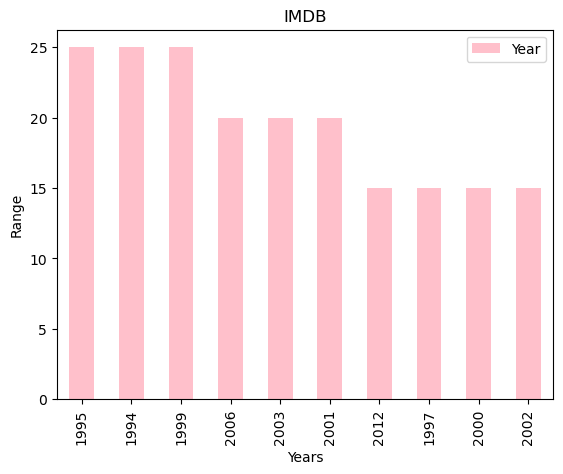

In [54]:
k.head(10).plot.bar(color="pink")
plt.title("IMDB")
plt.xlabel("Years")
plt.ylabel("Range")
plt.legend()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


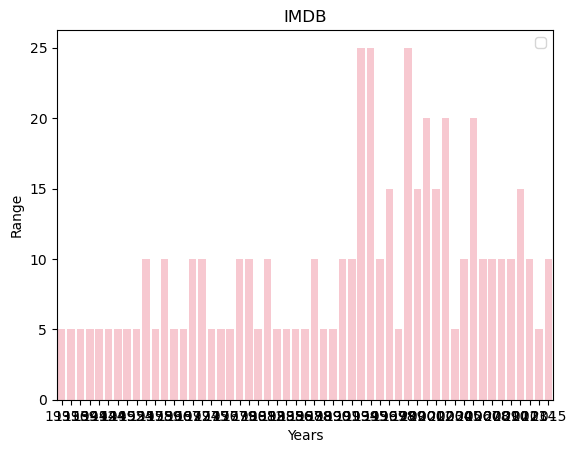

In [55]:
sns.countplot(x="Year",data=df,color="pink")
plt.title("IMDB")
plt.xlabel("Years")
plt.ylabel("Range")
plt.legend()
plt.show()

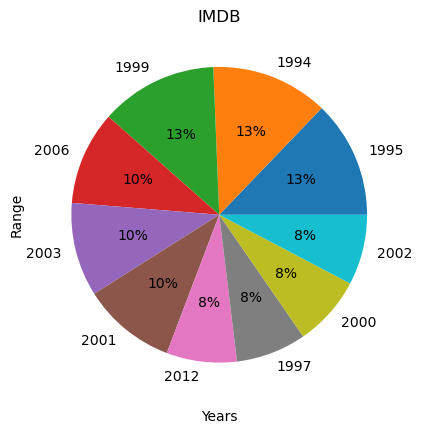

In [56]:
k.head(10).plot.pie(autopct='%.0f%%')
plt.title("IMDB")
plt.xlabel("Years")
plt.ylabel("Range")
plt.show()

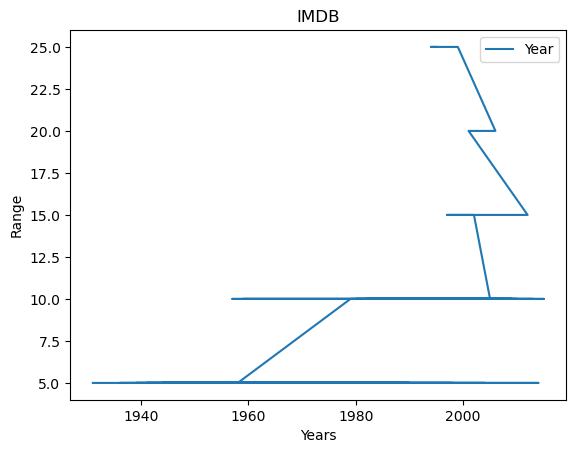

In [57]:
k.plot.line()
plt.title("IMDB")
plt.xlabel("Years")
plt.ylabel("Range")
plt.legend()
plt.show()

In [58]:
m=df["Metascore"].value_counts()
m

84    27
73    17
72    17
86    16
76    15
      ..
39     1
44     1
48     1
42     1
36     1
Name: Metascore, Length: 63, dtype: int64

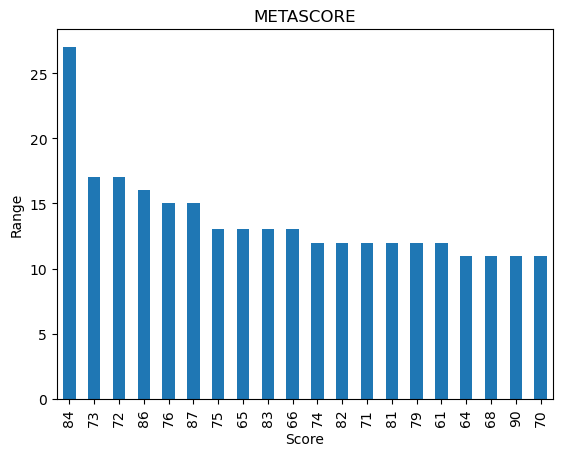

In [59]:
m.head(20).plot.bar()
plt.title("METASCORE")
plt.xlabel("Score")
plt.ylabel("Range")
plt.show()

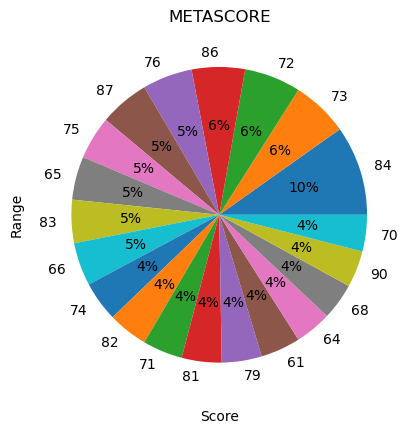

In [60]:
m.head(20).plot.pie(autopct="%.0f%%")
plt.title("METASCORE")
plt.xlabel("Score")
plt.ylabel("Range")
plt.show()

In [61]:
r=df["Rating"].value_counts()

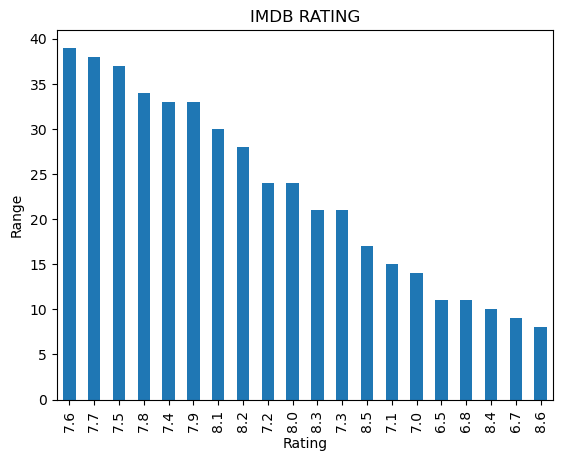

In [62]:
r.head(20).plot.bar()
plt.title("IMDB RATING")
plt.xlabel("Rating")
plt.ylabel("Range")
plt.show()

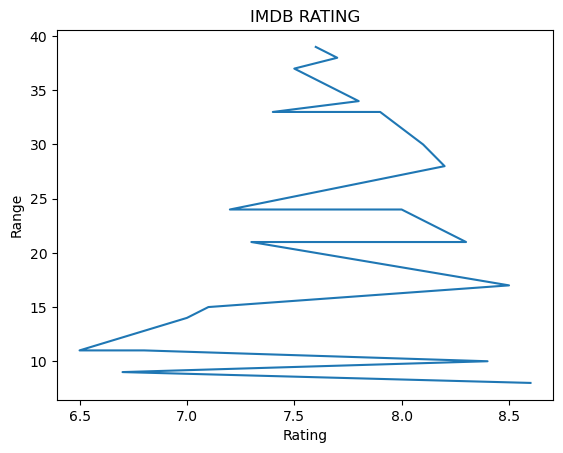

In [63]:
r.head(20).plot.line()
plt.title("IMDB RATING")
plt.xlabel("Rating")
plt.ylabel("Range")
plt.show()

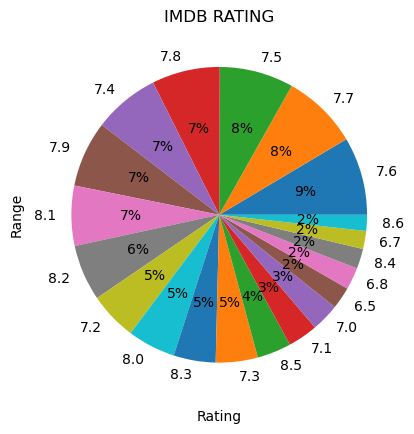

In [64]:
r.head(20).plot.pie(autopct='%.0f%%')
plt.title("IMDB RATING")
plt.xlabel("Rating")
plt.ylabel("Range")
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


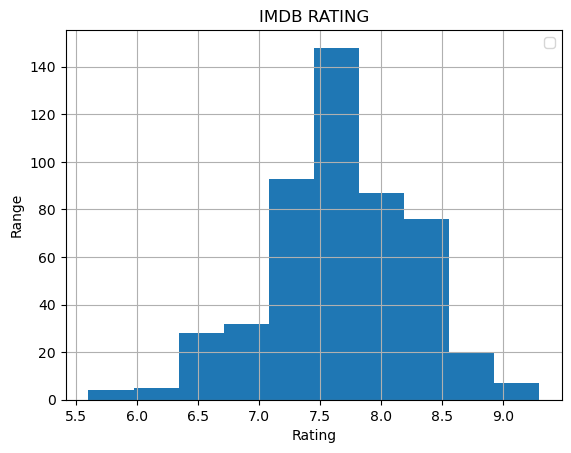

In [65]:
df["Rating"].hist()
plt.title("IMDB RATING")
plt.xlabel("Rating")
plt.ylabel("Range")
plt.legend()
plt.show()

C:\Users\Dell\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Metascore', ylabel='Density'>

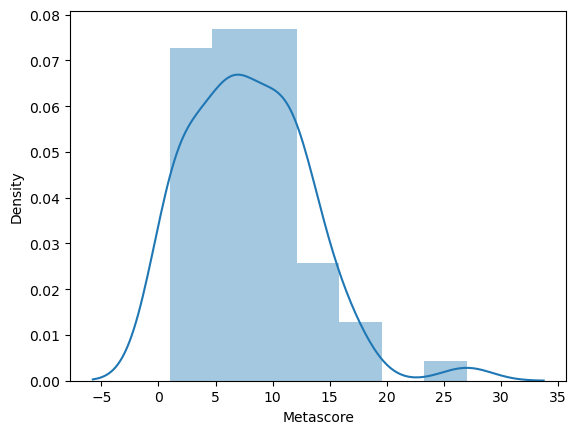

In [66]:
sns.distplot(m)

<AxesSubplot:ylabel='Density'>

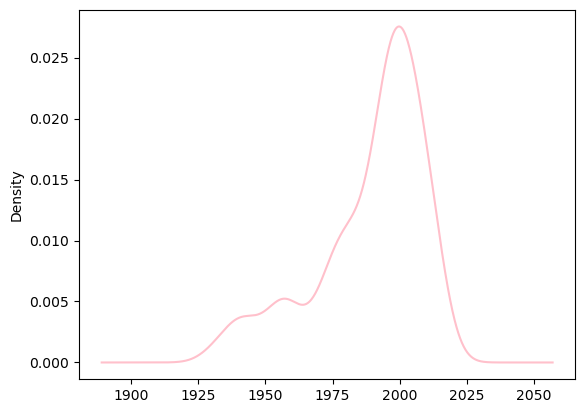

In [67]:
df["Year"].plot.density(color="pink")

<AxesSubplot:ylabel='Density'>

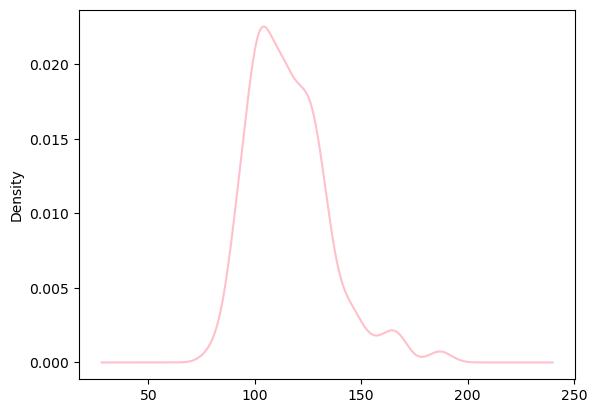

In [68]:
df["Runtime"].plot.density(color="pink")

<AxesSubplot:ylabel='Density'>

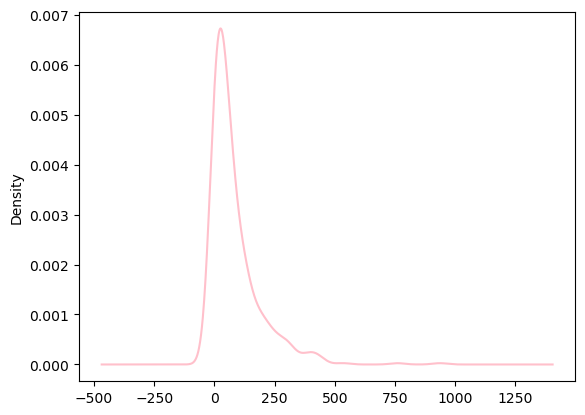

In [69]:
df["Gross"].plot.density(color="pink")

<AxesSubplot:ylabel='Density'>

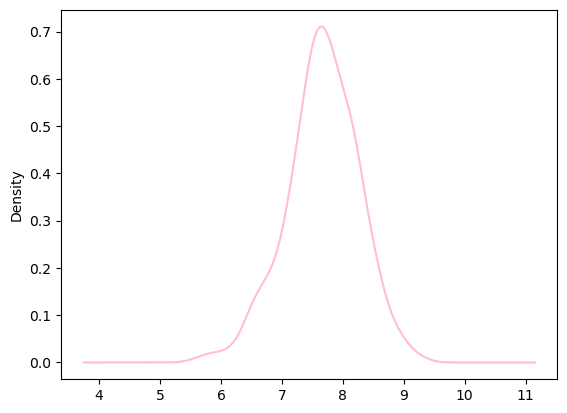

In [70]:

df["Rating"].plot.density(color="pink")

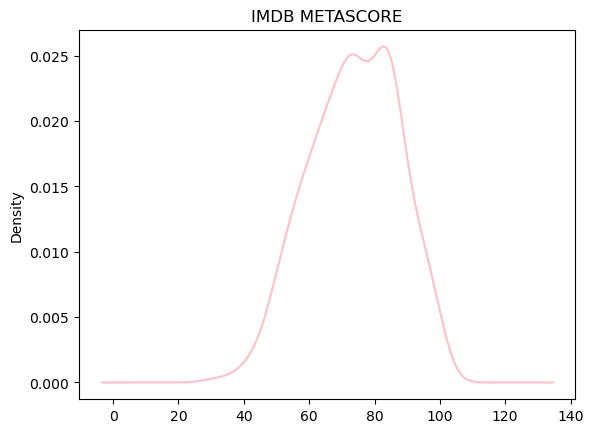

In [71]:
df["Metascore"].plot.density(color="pink")
plt.title("IMDB METASCORE")
plt.show()

In [72]:
df

,Title,Year,Runtime,Certificates,Genre,Gross,Rating,Metascore
0,The Godfather,1972,148,G,"Action, Adventure, Thriller",134.97,9.2,100
1,The Silence of the Lambs,1991,124,A,"Action, Adventure, Sci-Fi",130.74,8.6,86
2,Star Wars,1980,117,UA,"Crime, Drama, Thriller",290.48,8.7,82
3,The Shawshank Redemption,1994,143,R,"Adventure, Drama, Romance",28.34,9.3,82
4,The Shining,1980,138,A,"Action, Crime, Sci-Fi",44.02,8.4,66
...,...,...,...,...,...,...,...,...
495,Cool Hand Luke,1967,116,A,Comedy,90.57,6.6,49
496,Eternal Sunshine of the Spotless Mind,2004,91,R,"Adventure, Comedy, Drama",11.90,7.2,67
497,City Lights,1931,97,R,"Drama, Thriller",20.75,6.2,51
498,The Matrix,1999,105,A,"Action, Comedy, Horror",0.05,7.1,84


<AxesSubplot:ylabel='Density'>

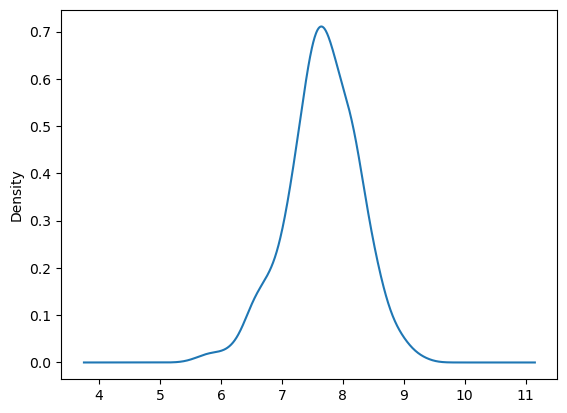

In [73]:
df["Rating"].plot.density()

In [74]:
t=df["Title"].value_counts()
t

Star Wars                20
The Lord of the Rings    15
L                        10
The Godfather             5
To Have and Have Not      5
                         ..
Citizen Kane              5
Back to the Future        5
Rear Window               5
North by Northwest        5
Sin City                  5
Name: Title, Length: 94, dtype: int64

<AxesSubplot:>

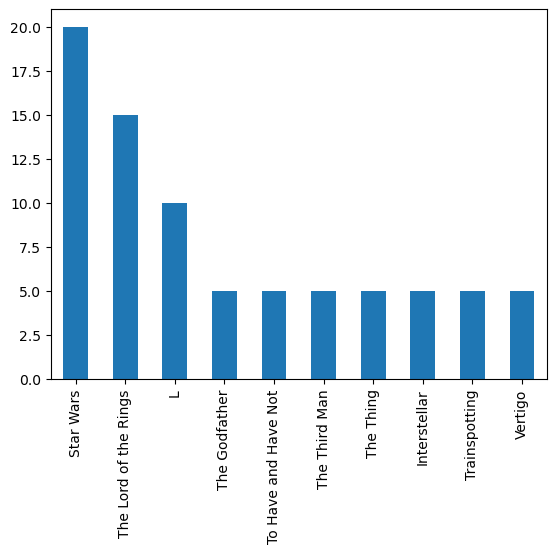

In [75]:
t.head(10).plot.bar()

<AxesSubplot:ylabel='Title'>

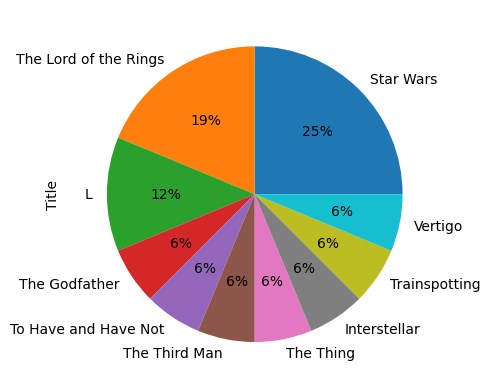

In [76]:
t.head(10).plot.pie(autopct="%.0f%%")

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


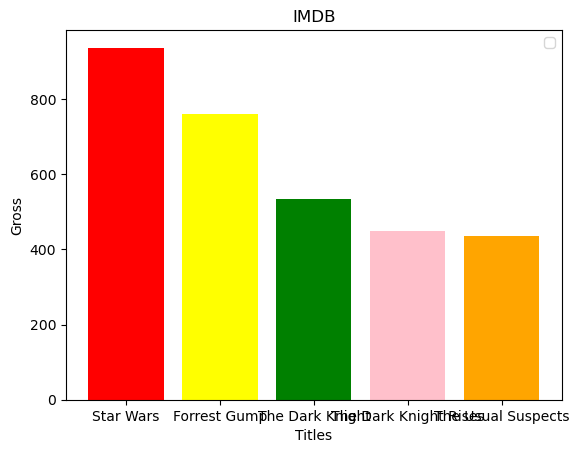

In [77]:
top_gross=df.nlargest(5,"Gross")
plt.bar(top_gross["Title"],top_gross["Gross"],color=["Red","Yellow","Green","Pink","Orange"])
plt.title("IMDB")
plt.xlabel("Titles")
plt.ylabel("Gross")
plt.legend()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


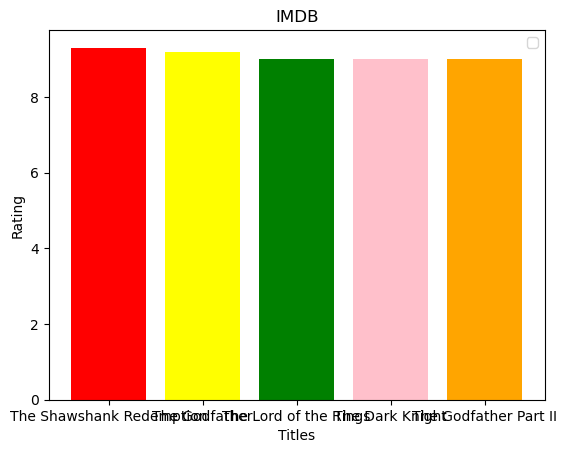

In [78]:
top_rating=df.nlargest(5,"Rating")
plt.bar(top_rating["Title"],top_rating["Rating"],color=["Red","Yellow","Green","Pink","Orange"])
plt.title("IMDB")
plt.xlabel("Titles")
plt.ylabel("Rating")
plt.legend()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


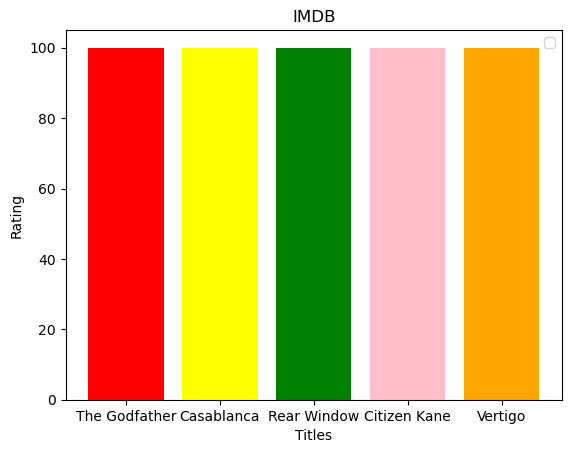

In [79]:
top_metascore=df.nlargest(5,"Metascore")
plt.bar(top_metascore["Title"],top_metascore["Metascore"],color=["Red","Yellow","Green","Pink","Orange"])
plt.title("IMDB")
plt.xlabel("Titles")
plt.ylabel("Rating")
plt.legend()
plt.show()

In [80]:
df

,Title,Year,Runtime,Certificates,Genre,Gross,Rating,Metascore
0,The Godfather,1972,148,G,"Action, Adventure, Thriller",134.97,9.2,100
1,The Silence of the Lambs,1991,124,A,"Action, Adventure, Sci-Fi",130.74,8.6,86
2,Star Wars,1980,117,UA,"Crime, Drama, Thriller",290.48,8.7,82
3,The Shawshank Redemption,1994,143,R,"Adventure, Drama, Romance",28.34,9.3,82
4,The Shining,1980,138,A,"Action, Crime, Sci-Fi",44.02,8.4,66
...,...,...,...,...,...,...,...,...
495,Cool Hand Luke,1967,116,A,Comedy,90.57,6.6,49
496,Eternal Sunshine of the Spotless Mind,2004,91,R,"Adventure, Comedy, Drama",11.90,7.2,67
497,City Lights,1931,97,R,"Drama, Thriller",20.75,6.2,51
498,The Matrix,1999,105,A,"Action, Comedy, Horror",0.05,7.1,84


# HISTOGRAM

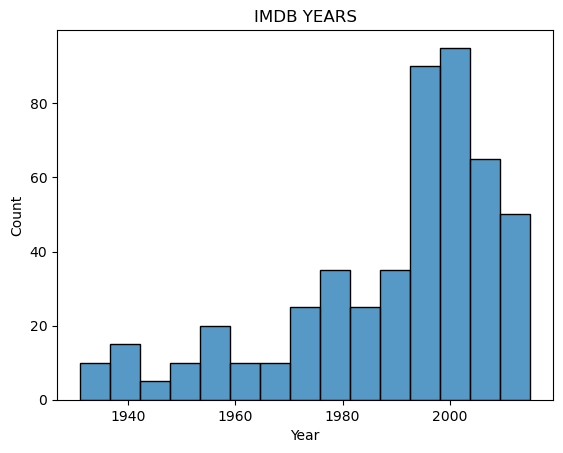

In [81]:
sns.histplot(df["Year"])
plt.title("IMDB YEARS")
plt.show()

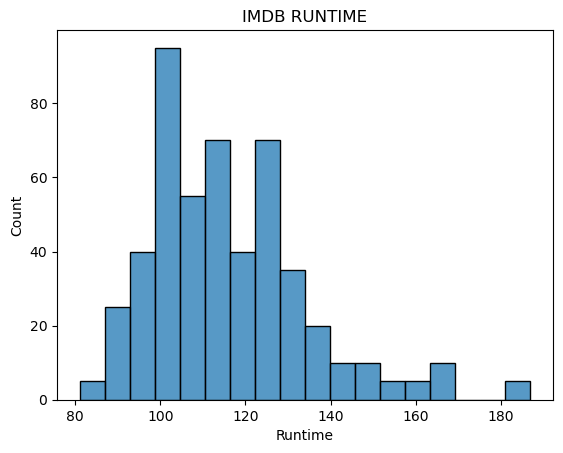

In [82]:
sns.histplot(df["Runtime"])
plt.title("IMDB RUNTIME")
plt.show()

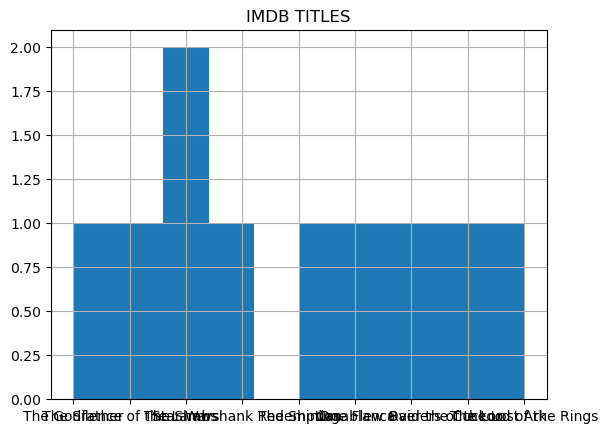

In [83]:
df["Title"].head(10).hist()
plt.title("IMDB TITLES")
plt.show()

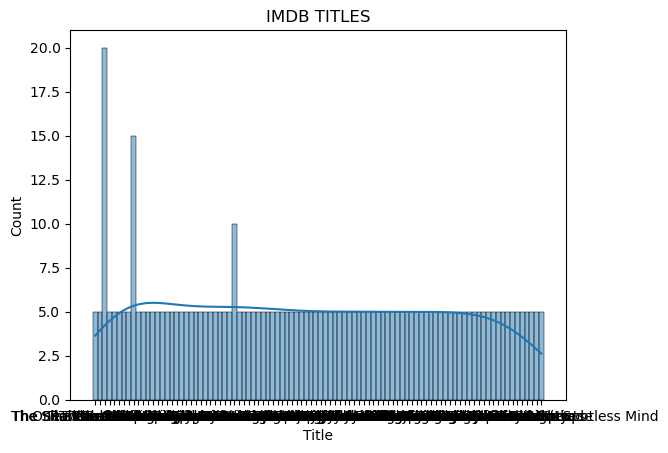

In [84]:
sns.histplot(x="Title",data=data,kde=True)
plt.title("IMDB TITLES")
plt.show()

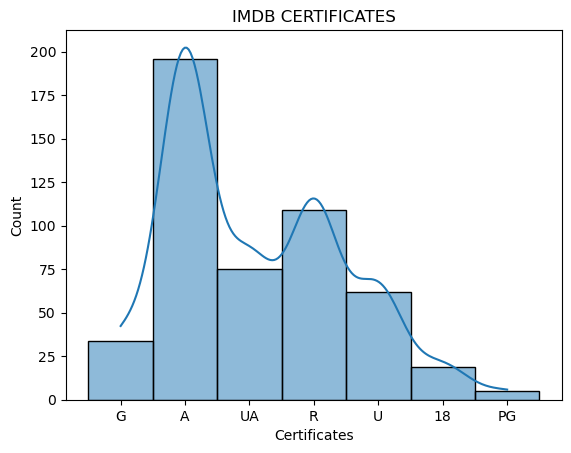

In [85]:
sns.histplot(x="Certificates",data=data,kde=True)
plt.title("IMDB CERTIFICATES")
plt.show()

# SCATTER PLOT

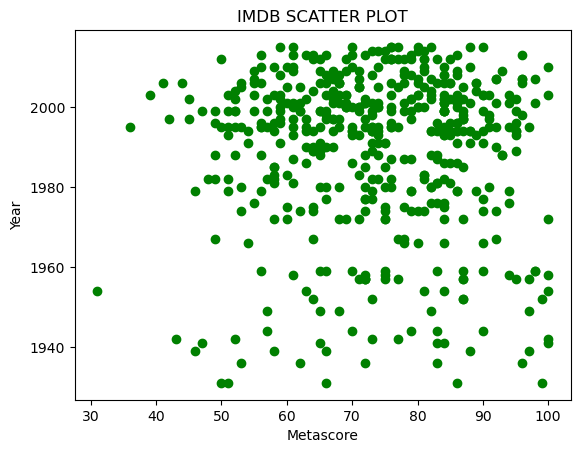

In [86]:
plt.scatter(df["Metascore"],df["Year"],color="Green")
plt.title("IMDB SCATTER PLOT")
plt.xlabel("Metascore")
plt.ylabel("Year")
plt.show()

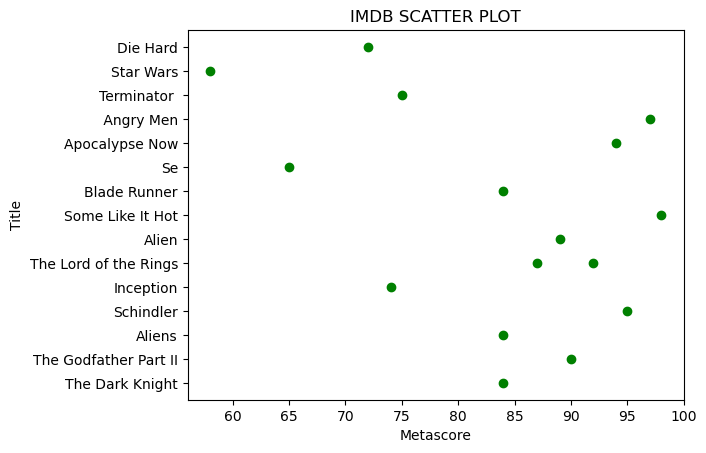

In [87]:
plt.scatter(df["Metascore"][10:26],df["Title"][10:26],color="Green")
plt.title("IMDB SCATTER PLOT")
plt.xlabel("Metascore")
plt.ylabel("Title")
plt.show()

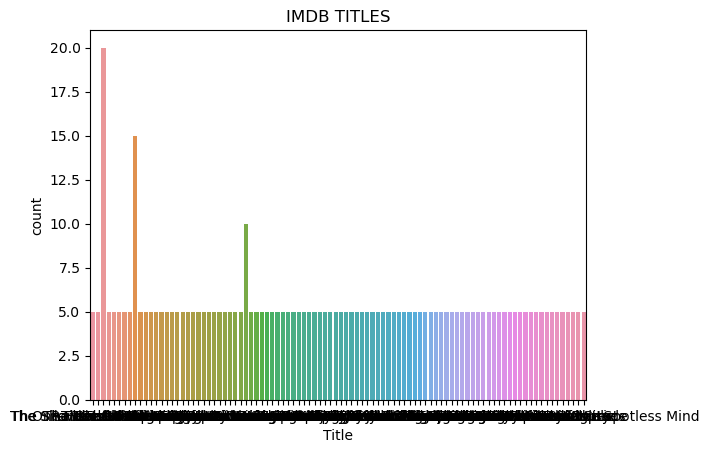

In [88]:
sns.countplot(x="Title",data=df)
plt.title("IMDB TITLES")
plt.show()

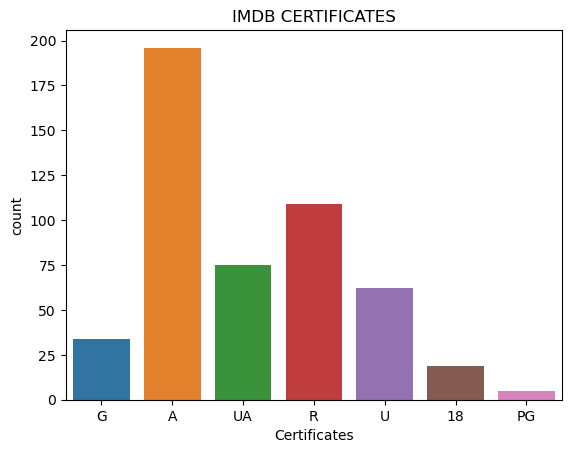

In [89]:
sns.countplot(x="Certificates",data=df)
plt.title("IMDB CERTIFICATES")
plt.show()

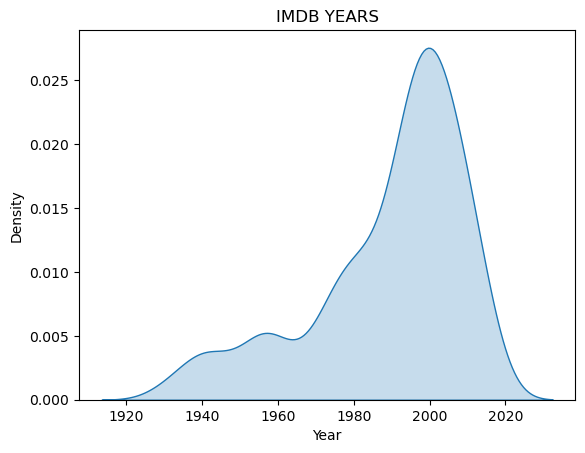

In [90]:
sns.kdeplot(df["Year"],shade=True)
plt.title("IMDB YEARS")
plt.show()

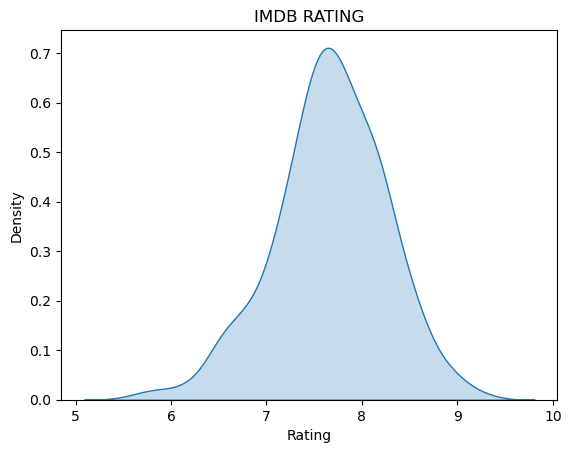

In [91]:
sns.kdeplot(df["Rating"],shade=True)
plt.title("IMDB RATING")
plt.show()

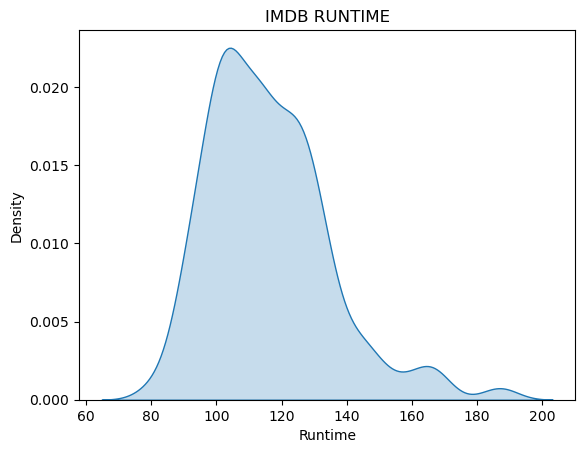

In [92]:
sns.kdeplot(df["Runtime"],shade=True)
plt.title("IMDB RUNTIME")
plt.show()

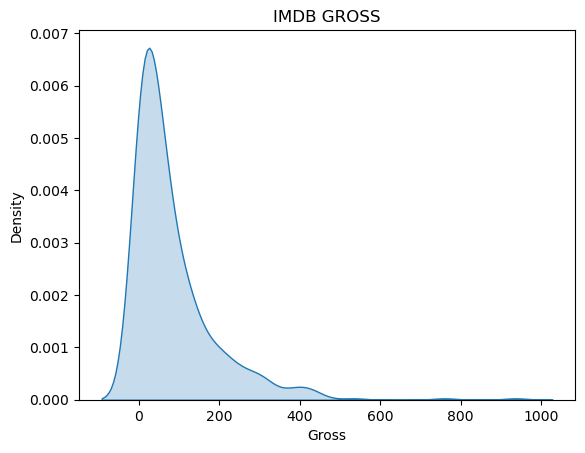

In [93]:
sns.kdeplot(df["Gross"],shade=True)
plt.title("IMDB GROSS")
plt.show()

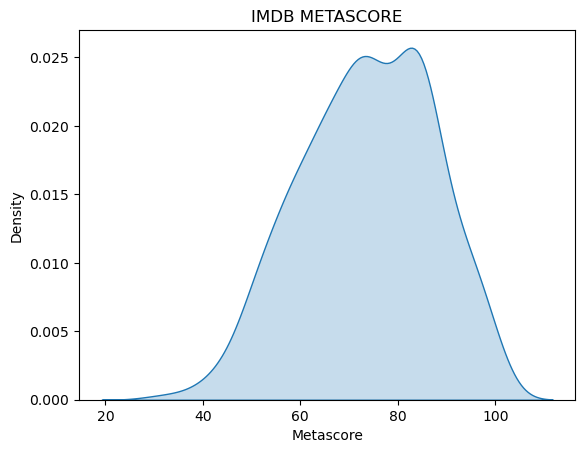

In [94]:
sns.kdeplot(df["Metascore"],shade=True)
plt.title("IMDB METASCORE")
plt.show()

In [95]:
df[["Metascore","Rating"]].corr()

,Metascore,Rating
Metascore,1.000000,0.516412
Rating,0.516412,1.000000


In [96]:
df

,Title,Year,Runtime,Certificates,Genre,Gross,Rating,Metascore
0,The Godfather,1972,148,G,"Action, Adventure, Thriller",134.97,9.2,100
1,The Silence of the Lambs,1991,124,A,"Action, Adventure, Sci-Fi",130.74,8.6,86
2,Star Wars,1980,117,UA,"Crime, Drama, Thriller",290.48,8.7,82
3,The Shawshank Redemption,1994,143,R,"Adventure, Drama, Romance",28.34,9.3,82
4,The Shining,1980,138,A,"Action, Crime, Sci-Fi",44.02,8.4,66
...,...,...,...,...,...,...,...,...
495,Cool Hand Luke,1967,116,A,Comedy,90.57,6.6,49
496,Eternal Sunshine of the Spotless Mind,2004,91,R,"Adventure, Comedy, Drama",11.90,7.2,67
497,City Lights,1931,97,R,"Drama, Thriller",20.75,6.2,51
498,The Matrix,1999,105,A,"Action, Comedy, Horror",0.05,7.1,84


# BOXPLOT

<AxesSubplot:xlabel='Year'>

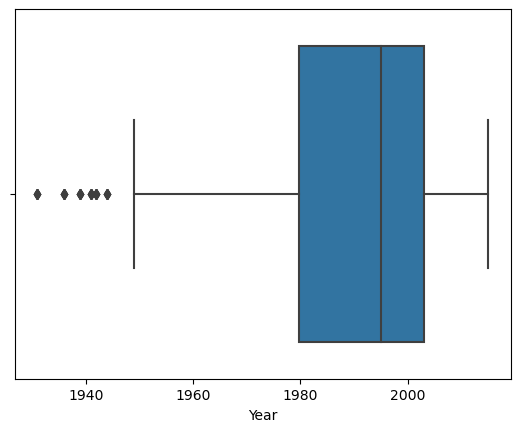

In [97]:
sns.boxplot(x=df["Year"])

In [98]:
Q1 = df['Year'].quantile(0.25)
Q3 = df['Year'].quantile(0.75)
print(Q1)
print(Q3)
Year_IQR = Q3 - Q1
print(Year_IQR)
Year_lower_bound = Q1 - 0.5 * Year_IQR
Year_upper_bound = Q3 + 0.5 * Year_IQR

print(Year_lower_bound)
print(Year_upper_bound)

clean_df = df[(df['Year'] > Year_lower_bound) & (df['Year'] < Year_upper_bound)]
print(df['Year'])

1979.75
2003.0
23.25
1968.125
2014.625
0      1972
1      1991
2      1980
3      1994
4      1980
       ... 
495    1967
496    2004
497    1931
498    1999
499    2005
Name: Year, Length: 500, dtype: int32


<AxesSubplot:>

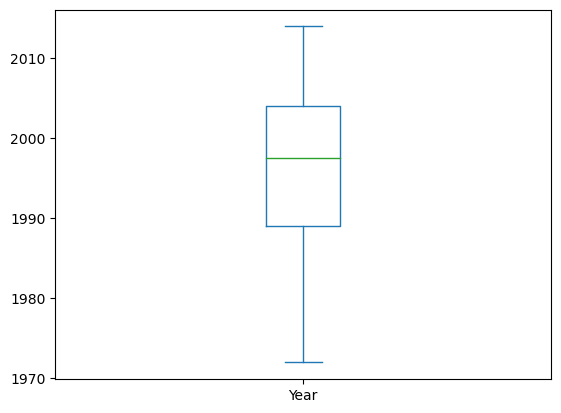

In [99]:
clean_df["Year"].plot(kind="box")

<AxesSubplot:xlabel='Runtime'>

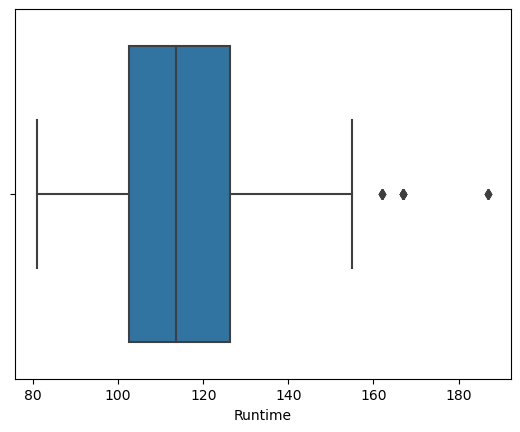

In [100]:
sns.boxplot(x=df["Runtime"])

In [101]:
Q1 = df["Runtime"].quantile(0.25)
Q3 = df['Year'].quantile(0.75)
print(Q1)
print(Q3)
Runtime_IQR = Q3 - Q1
print(Runtime_IQR)
Runtime_lower_bound = Q1 - 0.5 * Runtime_IQR
Runtime_upper_bound = Q3 + 0.5 * Runtime_IQR

print(Runtime_lower_bound)
print(Runtime_upper_bound)

clean_df = df[(df['Runtime'] > Year_lower_bound) & (df['Runtime'] < Year_upper_bound)]
print(df['Runtime'])

102.5
2003.0
1900.5
-847.75
2953.25
0      148
1      124
2      117
3      143
4      138
      ... 
495    116
496     91
497     97
498    105
499     99
Name: Runtime, Length: 500, dtype: int32


<AxesSubplot:xlabel='Metascore'>

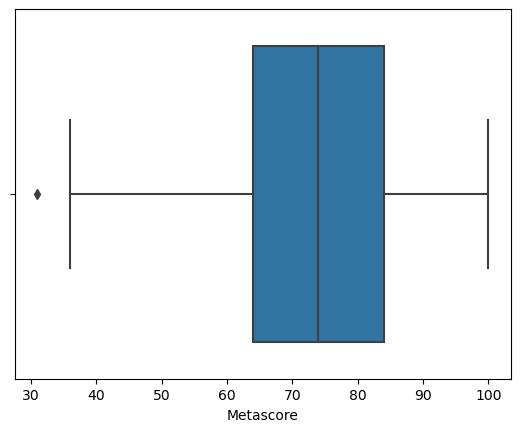

In [102]:
sns.boxplot(x=df["Metascore"])

In [103]:
Q1 = df["Metascore"].quantile(0.25)
Q3 = df['Metascore'].quantile(0.75)
print(Q1)
print(Q3)
Metascore_IQR = Q3 - Q1
print(Metascore_IQR)
Metascore_lower_bound = Q1 - 0.5 * Metascore_IQR
Metascore_upper_bound = Q3 + 0.5 * Metascore_IQR

print(Metascore_lower_bound)
print(Metascore_upper_bound)

clean_df = df[(df['Metascore'] > Metascore_lower_bound) & (df['Metascore'] < Metascore_upper_bound)]
print(df['Metascore'])

64.0
84.0
20.0
54.0
94.0
0      100
1       86
2       82
3       82
4       66
      ... 
495     49
496     67
497     51
498     84
499     71
Name: Metascore, Length: 500, dtype: int32


<AxesSubplot:>

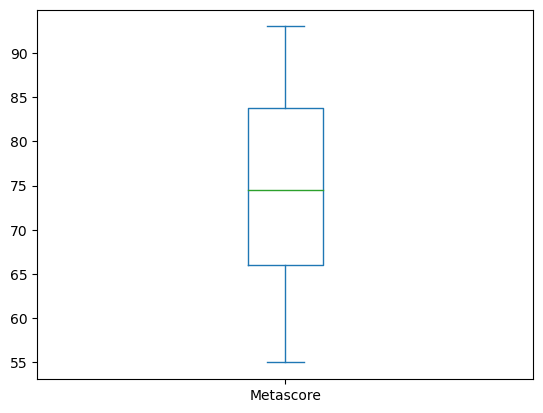

In [104]:
clean_df["Metascore"].plot(kind="box")

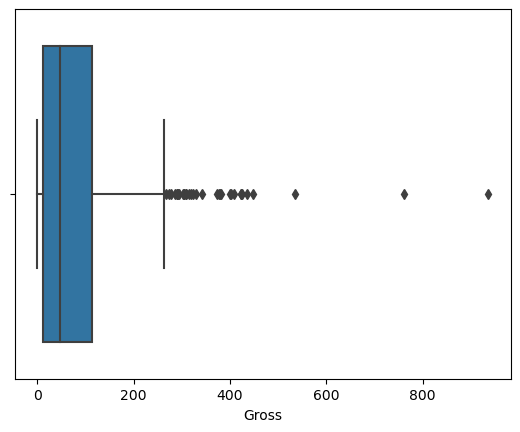

In [105]:
sns.boxplot(x=df["Gross"])
plt.show()

In [106]:
Q1 = df["Gross"].quantile(0.25)
Q3 = df['Gross'].quantile(0.75)
print(Q1)
print(Q3)
Gross_IQR = Q3 - Q1
print(Gross_IQR)
Gross_lower_bound = Q1 - 0.5 * Gross_IQR
Gross_upper_bound = Q3 + 0.5 * Gross_IQR

print(Gross_lower_bound)
print(Gross_upper_bound)

clean_df = df[(df['Gross'] > Gross_lower_bound) & (df['Gross'] < Gross_upper_bound)]
print(df['Gross'])

12.584999999999999
113.4675
100.88250000000001
-37.85625
163.90875
0      134.97
1      130.74
2      290.48
3       28.34
4       44.02
        ...  
495     90.57
496     11.90
497     20.75
498      0.05
499     26.02
Name: Gross, Length: 500, dtype: float64


<AxesSubplot:>

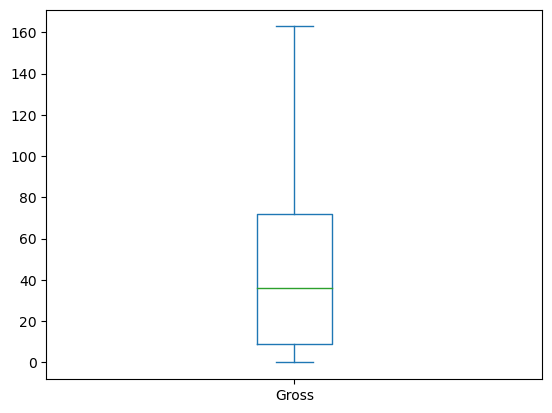

In [107]:
clean_df["Gross"].plot(kind="box")

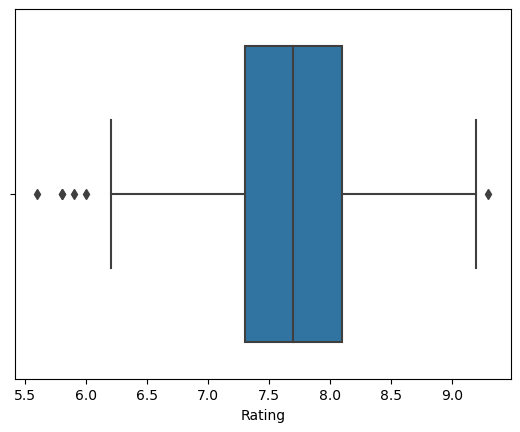

In [108]:
sns.boxplot(x=df["Rating"])
plt.show()

In [109]:
Q1 = df["Rating"].quantile(0.25)
Q3 = df['Rating'].quantile(0.75)
print(Q1)
print(Q3)
Rating_IQR = Q3 - Q1
print(Rating_IQR)
Rating_lower_bound = Q1 - 0.25 * Rating_IQR
Rating_upper_bound = Q3 + 0.25 * Rating_IQR

print(Rating_lower_bound)
print(Rating_upper_bound)

clean_df = df[(df['Rating'] > Rating_lower_bound) & (df['Rating'] < Rating_upper_bound)]
print(df["Rating"])

7.3
8.1
0.7999999999999998
7.1
8.299999999999999
0      9.2
1      8.6
2      8.7
3      9.3
4      8.4
      ... 
495    6.6
496    7.2
497    6.2
498    7.1
499    7.2
Name: Rating, Length: 500, dtype: float64


<AxesSubplot:>

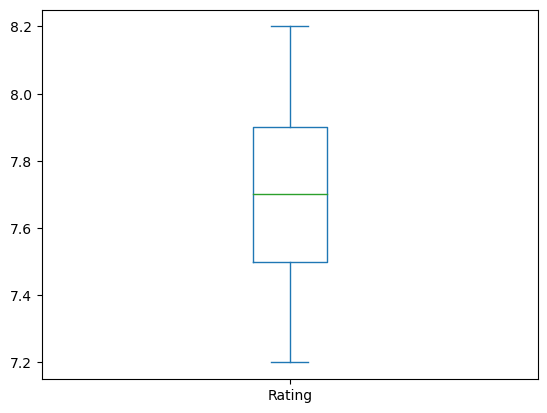

In [110]:
clean_df["Rating"].plot(kind="box")

# HEAT MAPS

<AxesSubplot:>

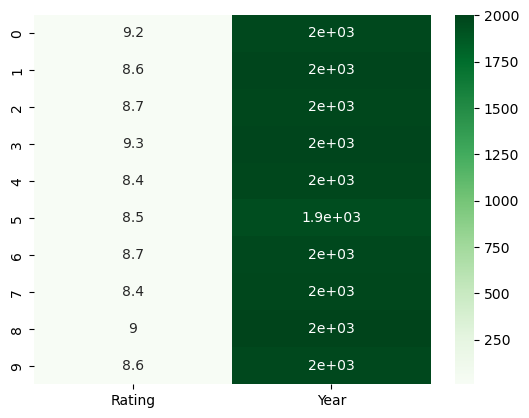

In [111]:
sns.heatmap(df[["Rating","Year"]].head(10),annot=True,cmap="Greens")

In [112]:
df[["Rating","Year"]].corr()

,Rating,Year
Rating,1.00000,-0.01522
Year,-0.01522,1.00000


<AxesSubplot:>

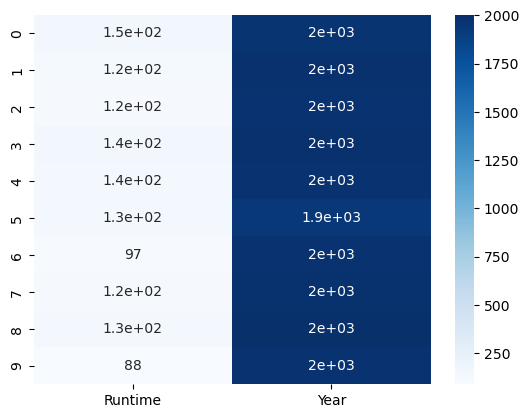

In [113]:
sns.heatmap(df[["Runtime","Year"]].head(10),annot=True,cmap="Blues")

In [114]:
df[["Runtime","Year"]].corr()

,Runtime,Year
Runtime,1.00000,-0.03241
Year,-0.03241,1.00000


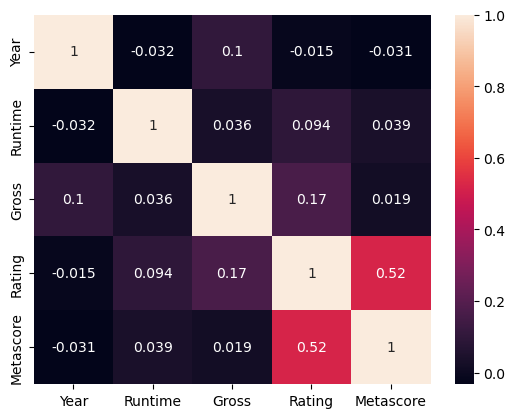

In [115]:
sns.heatmap(df.corr(),annot=True)
plt.show()

In [116]:
df.corr()

,Year,Runtime,Gross,Rating,Metascore
Year,1.000000,-0.032410,0.104666,-0.015220,-0.031350
Runtime,-0.032410,1.000000,0.035900,0.093979,0.039340
Gross,0.104666,0.035900,1.000000,0.166455,0.019365
Rating,-0.015220,0.093979,0.166455,1.000000,0.516412
Metascore,-0.031350,0.039340,0.019365,0.516412,1.000000


# PAIR PLOT

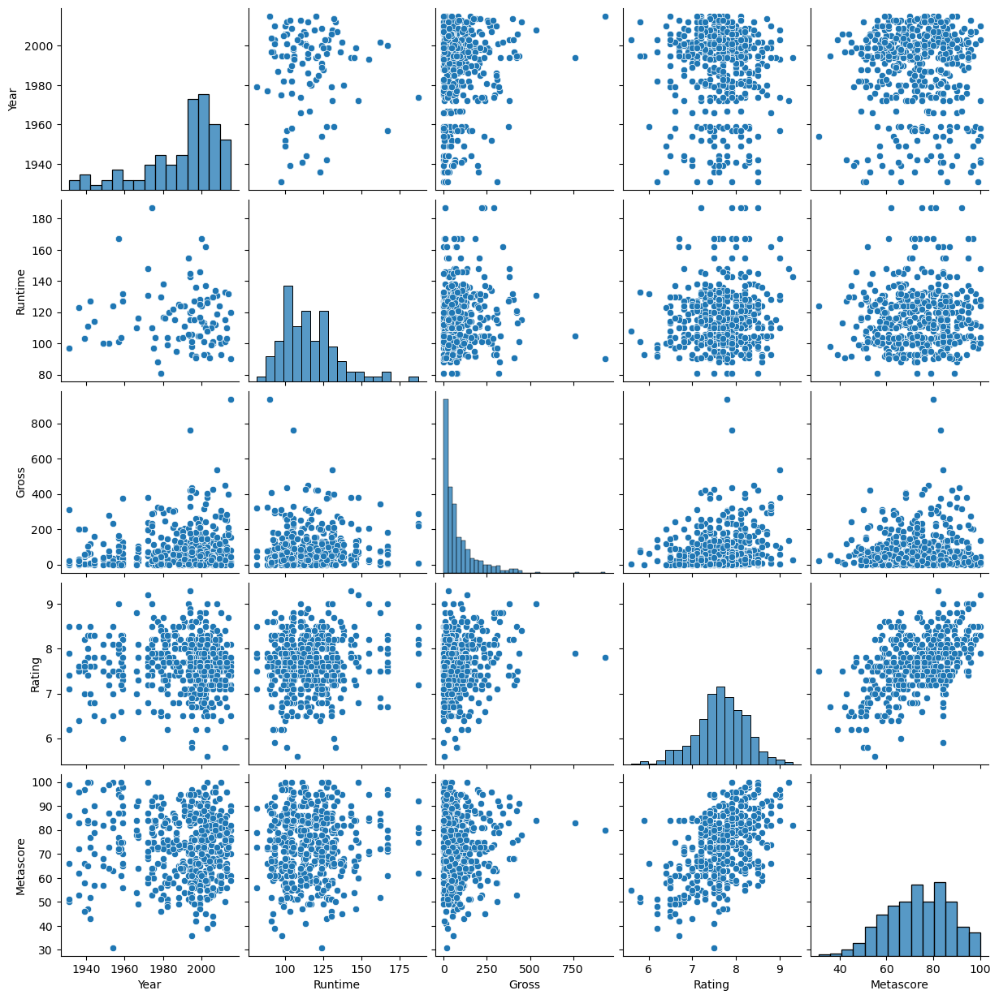

In [117]:
sns.pairplot(df)
plt.show()

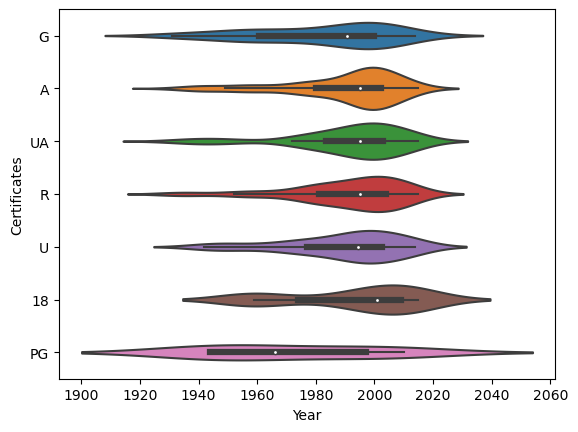

In [118]:
sns.violinplot(data=df,x='Year',y='Certificates')
plt.show()

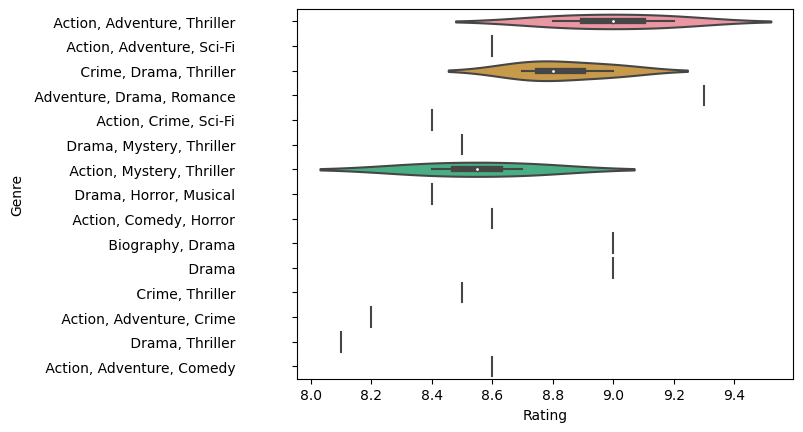

In [119]:
sns.violinplot(data=df.head(20),x='Rating',y='Genre')
plt.show()

In [120]:
df

,Title,Year,Runtime,Certificates,Genre,Gross,Rating,Metascore
0,The Godfather,1972,148,G,"Action, Adventure, Thriller",134.97,9.2,100
1,The Silence of the Lambs,1991,124,A,"Action, Adventure, Sci-Fi",130.74,8.6,86
2,Star Wars,1980,117,UA,"Crime, Drama, Thriller",290.48,8.7,82
3,The Shawshank Redemption,1994,143,R,"Adventure, Drama, Romance",28.34,9.3,82
4,The Shining,1980,138,A,"Action, Crime, Sci-Fi",44.02,8.4,66
...,...,...,...,...,...,...,...,...
495,Cool Hand Luke,1967,116,A,Comedy,90.57,6.6,49
496,Eternal Sunshine of the Spotless Mind,2004,91,R,"Adventure, Comedy, Drama",11.90,7.2,67
497,City Lights,1931,97,R,"Drama, Thriller",20.75,6.2,51
498,The Matrix,1999,105,A,"Action, Comedy, Horror",0.05,7.1,84


<AxesSubplot:xlabel='Runtime', ylabel='Count'>

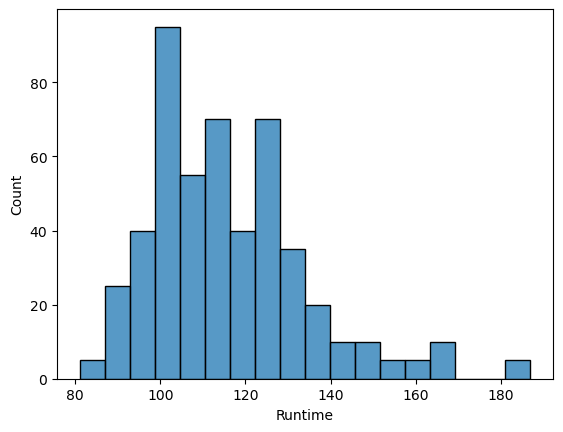

In [121]:
sns.histplot(df["Runtime"])

C:\Users\Dell\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:ylabel='Density'>

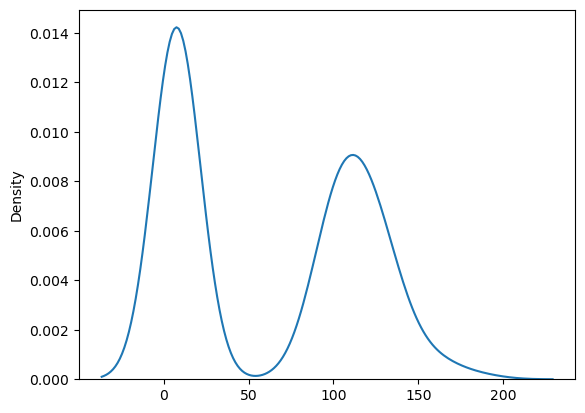

In [122]:
sns.distplot(df[["Runtime","Rating"]],hist=False)

<AxesSubplot:>

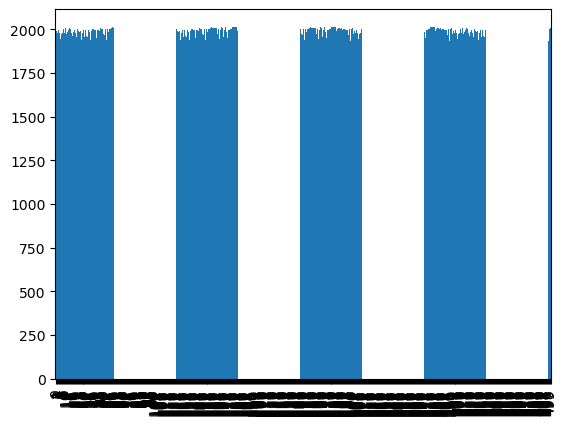

In [123]:
df["Year"].plot.bar()

In [124]:
from numpy import random

In [126]:
sns.distplot(random.binomial(n=10,p=0.5,size=1000),hist=True,Kde=False)

TypeError: distplot() got an unexpected keyword argument 'Kde'

# PROFILING REPORT

In [127]:
import ydata_profiling 

In [128]:
from ydata_profiling import ProfileReport

In [129]:
profile=ProfileReport(df,title="profiling Report")

In [130]:
profile.to_html()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

'<!doctype html><html lang=en><head><meta charset=utf-8><meta name=viewport content="width=device-width, initial-scale=1, shrink-to-fit=no"><meta name=description content="Profile report generated by YData! Visit us at https://ydata.ai"><meta name=author content="YData and the open source community."><meta name=generator content="Pandas Profiling vv4.2.0"><meta name=url content=https://github.com/ydataai/ydata-profiling><meta name=date content="2023-06-22 06:14:54.509430"><title>profiling Report</title><style>\n/*!\n * Bootstrap v3.3.7 (http://getbootstrap.com)\n * Copyright 2011-2016 Twitter, Inc.\n * Licensed under MIT (https://github.com/twbs/bootstrap/blob/master/LICENSE)\n *//*! normalize.css v3.0.3 | MIT License | github.com/necolas/normalize.css */html{font-family:sans-serif;-webkit-text-size-adjust:100%;-ms-text-size-adjust:100%}body{margin:0}article,aside,details,figcaption,figure,footer,header,hgroup,main,menu,nav,section,summary{display:block}audio,canvas,progress,video{disp

In [131]:
profile

# PYGWALKER 

In [132]:
import pygwalker as pg

In [133]:
pg.walk(df)

In [134]:
df

,Title,Year,Runtime,Certificates,Genre,Gross,Rating,Metascore
0,The Godfather,1972,148,G,"Action, Adventure, Thriller",134.97,9.2,100
1,The Silence of the Lambs,1991,124,A,"Action, Adventure, Sci-Fi",130.74,8.6,86
2,Star Wars,1980,117,UA,"Crime, Drama, Thriller",290.48,8.7,82
3,The Shawshank Redemption,1994,143,R,"Adventure, Drama, Romance",28.34,9.3,82
4,The Shining,1980,138,A,"Action, Crime, Sci-Fi",44.02,8.4,66
...,...,...,...,...,...,...,...,...
495,Cool Hand Luke,1967,116,A,Comedy,90.57,6.6,49
496,Eternal Sunshine of the Spotless Mind,2004,91,R,"Adventure, Comedy, Drama",11.90,7.2,67
497,City Lights,1931,97,R,"Drama, Thriller",20.75,6.2,51
498,The Matrix,1999,105,A,"Action, Comedy, Horror",0.05,7.1,84


In [135]:
df["Rating"].max()

9.3

In [136]:
df["Gross"].max()

936.66

In [137]:
df["Metascore"].max()

100

  File "C:\Users\Dell\anaconda3\lib\site-packages\aiohttp\connector.py", line 980, in _wrap_create_connection
    return await self._loop.create_connection(*args, **kwargs)  # type: ignore[return-value]  # noqa
  File "C:\Users\Dell\anaconda3\lib\asyncio\base_events.py", line 1090, in create_connection
    transport, protocol = await self._create_connection_transport(
  File "C:\Users\Dell\anaconda3\lib\asyncio\base_events.py", line 1120, in _create_connection_transport
    await waiter
  File "C:\Users\Dell\anaconda3\lib\asyncio\sslproto.py", line 534, in data_received
    ssldata, appdata = self._sslpipe.feed_ssldata(data)
  File "C:\Users\Dell\anaconda3\lib\asyncio\sslproto.py", line 188, in feed_ssldata
    self._sslobj.do_handshake()
  File "C:\Users\Dell\anaconda3\lib\ssl.py", line 945, in do_handshake
    self._sslobj.do_handshake()
ssl.SSLCertVerificationError: [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1129)

The 

In [ ]:
df